# CSE 475 - Assignment 01
## Group Information

| Field | Details |
|-------------------------|-------------------------------------|
| Group ID | Group 01 |
| Student 1 Name | Ahsanur Parul |
| Student 1 ID | 2022-3-60-190 |
| Student 2 Name | Tasnim Zaman |
| Student 2 ID | 2023-1-60-058 |
| Student 3 Name | Jannatul Ferdous Jerin |
| Student 3 ID | 2023-1-60-099 |
| Student 4 Name | Nabila Ibnat |
| Student 4 ID | 2023-1-60-136 |
| Notebook Type | Transformer Models: DeiT |
| Dataset Source Name | Brinjal Dataset |
| Dataset Source Link | https://www.kaggle.com/datasets/ahsanurparul/brinjal-460x460 |
| Kaggle Dataset Path | /kaggle/input/brinjal-460x460 |
| Submission Date | 31 March 2026 |

# Global Configuration

In [1]:
import os
import math
import random
import torch
import numpy as np


class Config:
    # ── Paths ──────────────────────────────────────────────────
    DATA_DIR       = "/kaggle/input/datasets/ahsanurparul/brinjal-460x460"
    CHECKPOINT_DIR = "./checkpoints"

    # ── Model ──────────────────────────────────────────────────
    MODEL_NAME    = 'deit_base_patch16_224'
    PATCH_SIZE    = 16
    POS_EMBEDDING = 'learnable_interpolated'   # bilinear interp to 464px grid

    # ── Dataset ─────────────────────────────────────────────────
    IMAGE_SIZE  = 460   # native resolution; padded to PADDED_SIZE in transforms
    PADDED_SIZE = 464   # 460 + 2px each side → 464 / 16 = 29 exact patches
    CHANNELS    = 3

    # ── Training ────────────────────────────────────────────────
    # NOTE: Hyperparameters deliberately match the ViT notebook so that
    # architecture is the only variable in the comparison notebook.
    BATCH_SIZE               = 16
    EPOCHS                   = 30
    LEARNING_RATE            = 3e-5
    WEIGHT_DECAY             = 0.05
    WARMUP_EPOCHS            = 3
    MIN_LR                   = 1e-6
    CLIP_GRAD_NORM           = 1.0
    LABEL_SMOOTHING          = 0.1
    EARLY_STOPPING_PATIENCE  = 5

    # ── Reproducibility ─────────────────────────────────────────
    SEED = 42

    # ── Hardware ────────────────────────────────────────────────
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def seed_everything(seed: int = Config.SEED) -> None:
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False


seed_everything()
os.makedirs(Config.CHECKPOINT_DIR, exist_ok=True)

print(f"✓ Config loaded")
print(f"  Device      : {Config.DEVICE}")
print(f"  Seed        : {Config.SEED}")
print(f"  Model       : {Config.MODEL_NAME}")
print(f"  Patch size  : {Config.PATCH_SIZE}px  →  {Config.PADDED_SIZE // Config.PATCH_SIZE}×{Config.PADDED_SIZE // Config.PATCH_SIZE} grid = {(Config.PADDED_SIZE // Config.PATCH_SIZE)**2} tokens")
print(f"  LR / WD     : {Config.LEARNING_RATE} / {Config.WEIGHT_DECAY}")
print(f"  Note: all training hyperparameters identical to ViT notebook for fair comparison.")

✓ Config loaded
  Device      : cuda
  Seed        : 42
  Model       : deit_base_patch16_224
  Patch size  : 16px  →  29×29 grid = 841 tokens
  LR / WD     : 3e-05 / 0.05
  Note: all training hyperparameters identical to ViT notebook for fair comparison.


# Setup & Imports

In [2]:
!pip install -q timm thop torchmetrics

In [3]:
import time
import math
import copy
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from io import BytesIO

import torch
import torch.nn as nn
import torch.optim as optim
from torch.amp import autocast, GradScaler
from torch.utils.data import DataLoader, random_split, Subset
from torchvision import datasets, transforms

import timm
from thop import profile, clever_format
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support,
    confusion_matrix, classification_report
)
import warnings
warnings.filterwarnings('ignore')

# ── Verification ──────────────────────────────────────────────
print(f"PyTorch version : {torch.__version__}")
print(f"timm version    : {timm.__version__}")
if torch.cuda.is_available():
    print(f"GPU             : {torch.cuda.get_device_name(0)}")
    print(f"VRAM            : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
else:
    print("GPU             : NOT FOUND — training will be very slow on CPU")

# ── Available pretrained DeiT variants ────────────────────────
deit_variants = timm.list_models('deit_base*', pretrained=True)
print(f"\nAvailable deit_base pretrained variants ({len(deit_variants)} found):")
for v in deit_variants:
    print(f"  {v}")

PyTorch version : 2.10.0+cu128
timm version    : 1.0.25
GPU             : Tesla T4
VRAM            : 15.6 GB

Available deit_base pretrained variants (4 found):
  deit_base_distilled_patch16_224.fb_in1k
  deit_base_distilled_patch16_384.fb_in1k
  deit_base_patch16_224.fb_in1k
  deit_base_patch16_384.fb_in1k


# Exploratory Data Analysis (EDA)

Total images : 1,823
Num classes  : 5

Per-class counts:
  Brinjal Fruit Creaking              :   200 ( 11.0%)  ████████
  Healty Brinjal                      :   514 ( 28.2%)  █████████████████████
  Phomopsis Bright                    :   161 (  8.8%)  ██████
  Shoot and Fruit Borer               :   725 ( 39.8%)  ██████████████████████████████
  Wet Rot                             :   223 ( 12.2%)  █████████

Imbalance ratio (max/min) : 4.50×
  ⚠  Significant imbalance — consider class-weighted loss in the comparison.


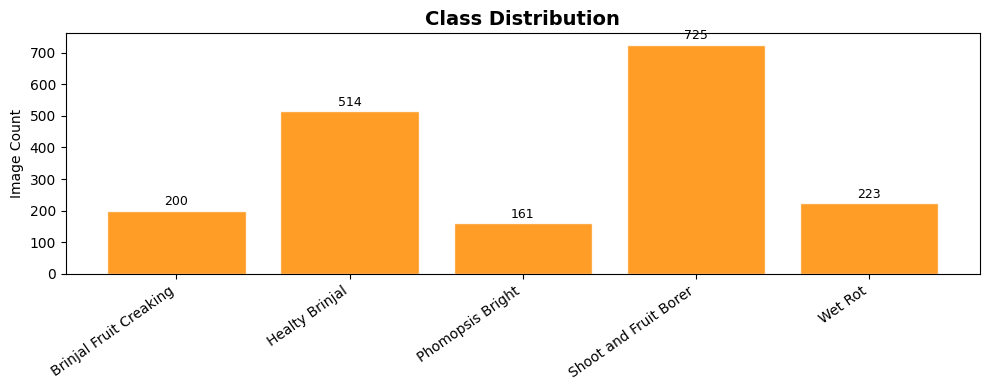

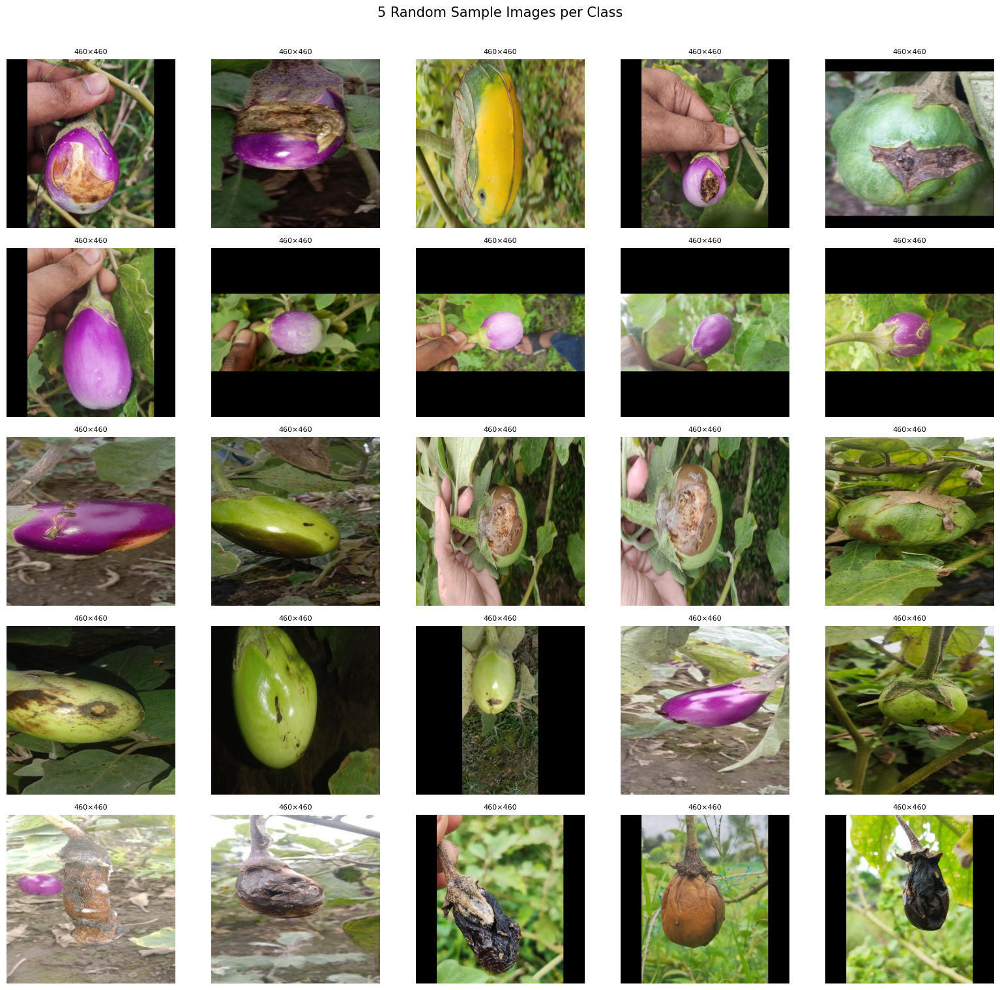

Sampling image sizes (up to 500 images for speed)...

Width  : mean=460.0  std=0.00  min=460  max=460
Height : mean=460.0  std=0.00  min=460  max=460


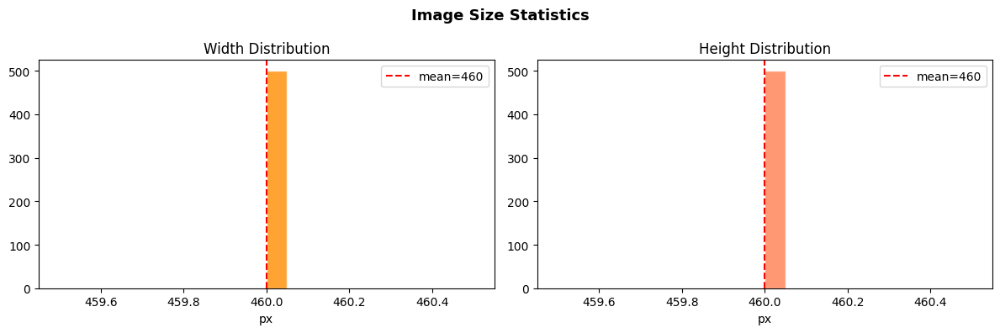

In [4]:
# ── 1. Dataset inventory ──────────────────────────────────────
temp_dataset = datasets.ImageFolder(root=Config.DATA_DIR)
classes      = temp_dataset.classes
num_classes  = len(classes)

class_counts = {cls: 0 for cls in classes}
for _, lbl in temp_dataset.samples:
    class_counts[classes[lbl]] += 1

print(f"Total images : {len(temp_dataset):,}")
print(f"Num classes  : {num_classes}")
print(f"\nPer-class counts:")
max_c = max(class_counts.values())
min_c = min(class_counts.values())
for cls, cnt in class_counts.items():
    pct  = 100 * cnt / len(temp_dataset)
    bar  = '█' * int(30 * cnt / max_c)
    print(f"  {cls:35s} : {cnt:5d} ({pct:5.1f}%)  {bar}")

imbalance_ratio = max_c / min_c
print(f"\nImbalance ratio (max/min) : {imbalance_ratio:.2f}×")
if imbalance_ratio > 3:
    print("  ⚠  Significant imbalance — consider class-weighted loss in the comparison.")
else:
    print("  ✓  Dataset is reasonably balanced.")

# ── 2. Class distribution bar chart ───────────────────────────
plt.figure(figsize=(max(10, num_classes * 1.6), 4))
bars = plt.bar(class_counts.keys(), class_counts.values(),
               color='darkorange', edgecolor='white', alpha=0.85)
for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height() + max_c * 0.01,
             str(int(bar.get_height())),
             ha='center', va='bottom', fontsize=9)
plt.title("Class Distribution", fontsize=14, fontweight='bold')
plt.ylabel("Image Count")
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

# ── 3. 5 random samples per class ─────────────────────────────
num_samples = 5
fig, axes = plt.subplots(num_classes, num_samples, figsize=(16, 3 * num_classes))
if num_classes == 1:
    axes = np.expand_dims(axes, 0)

for i, cls in enumerate(classes):
    paths  = [p for p, l in temp_dataset.samples if l == i]
    picked = random.sample(paths, min(num_samples, len(paths)))
    for j in range(num_samples):
        ax = axes[i, j]
        if j < len(picked):
            img = Image.open(picked[j])
            ax.imshow(img)
            ax.set_title(f"{img.size[0]}×{img.size[1]}", fontsize=8)
            if j == 0:
                ax.set_ylabel(cls, fontsize=10, rotation=0, labelpad=55, ha='right')
        ax.axis('off')

plt.suptitle("5 Random Sample Images per Class", fontsize=15, y=1.01)
plt.tight_layout()
plt.show()

# ── 4. Image size statistics ──────────────────────────────────
print("Sampling image sizes (up to 500 images for speed)...")
sample_n = min(500, len(temp_dataset))
idx_pool = random.sample(range(len(temp_dataset)), sample_n)
sizes    = []
for i in idx_pool:
    with Image.open(temp_dataset.samples[i][0]) as img:
        sizes.append(img.size)   # (W, H)

widths  = [s[0] for s in sizes]
heights = [s[1] for s in sizes]

print(f"\nWidth  : mean={np.mean(widths):.1f}  std={np.std(widths):.2f}  "
      f"min={min(widths)}  max={max(widths)}")
print(f"Height : mean={np.mean(heights):.1f}  std={np.std(heights):.2f}  "
      f"min={min(heights)}  max={max(heights)}")

fig, axes2 = plt.subplots(1, 2, figsize=(12, 4))
axes2[0].hist(widths,  bins=20, color='darkorange', edgecolor='white', alpha=0.8)
axes2[0].axvline(np.mean(widths), color='red', linestyle='--', label=f'mean={np.mean(widths):.0f}')
axes2[0].set_title("Width Distribution"); axes2[0].set_xlabel("px"); axes2[0].legend()

axes2[1].hist(heights, bins=20, color='coral', edgecolor='white', alpha=0.8)
axes2[1].axvline(np.mean(heights), color='red', linestyle='--', label=f'mean={np.mean(heights):.0f}')
axes2[1].set_title("Height Distribution"); axes2[1].set_xlabel("px"); axes2[1].legend()

plt.suptitle("Image Size Statistics", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

## EDA Observations & Patch-Tokenisation Impact

**Class balance**: See the imbalance ratio printed above. A ratio below 3× means
standard cross-entropy with label smoothing is sufficient; above 3× consider
class-weighted loss.

**Resolution & patch tokenisation**:
- All images are **460×460 px** (uniform — no resize needed).
- DeiT (`deit_base_patch16_224`) uses the same patch size (16×16) as ViT.
- At 460 px: 460 ÷ 16 = **28.75** — not an integer, so patches would straddle edges.
- **Fix applied**: pad 2 px on each side → **464×464**. Now 464 ÷ 16 = **29 exactly** → **29×29 = 841** spatial patch tokens.
- We use `dynamic_img_size=True` so timm **bilinearly interpolates** the pre-trained 14×14
  positional embeddings up to 29×29.

**DeiT token sequence** (important for attention visualisation):
`[CLS(0),  DistToken(1),  patch_0(2),  patch_1(3),  …,  patch_840(842)]`
Spatial patches begin at **index 2**, not 1 as in ViT. Using index 1 would
include the distillation token in the attention spatial grid and corrupt the heatmap.

**Image quality**: Visually uniform resolution, consistent framing, no obvious blur or label noise
detected in the sample grid. No pre-filtering required.

# Data Preprocessing & Augmentation

In [5]:
# ── Transforms ────────────────────────────────────────────────
# Training: pad → augment → tensor → normalise  (augmentation on-the-fly, train only)
train_transforms = transforms.Compose([
    transforms.Pad([2, 2, 2, 2]),                          # 460 → 464 px
    transforms.RandAugment(num_ops=2, magnitude=9),        # advanced augmentation
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],       # ImageNet mean/std
                         std=[0.229, 0.224, 0.225])
])

# Val / Test: pad → tensor → normalise  (no augmentation — no leakage)
val_test_transforms = transforms.Compose([
    transforms.Pad([2, 2, 2, 2]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ── Reproducible 70 / 15 / 15 split ───────────────────────────
# CRITICAL: same SEED and generator as ViT notebook → identical train/val/test indices.
# This guarantees a controlled experiment — all three models see exactly the same images.
base_dataset = datasets.ImageFolder(root=Config.DATA_DIR)
total_size   = len(base_dataset)
train_size   = int(0.70 * total_size)
val_size     = int(0.15 * total_size)
test_size    = total_size - train_size - val_size

generator = torch.Generator().manual_seed(Config.SEED)
train_temp, val_temp, test_temp = random_split(
    base_dataset, [train_size, val_size, test_size], generator=generator
)

# Separate dataset instances prevent transform leakage across splits
train_full = datasets.ImageFolder(root=Config.DATA_DIR, transform=train_transforms)
val_full   = datasets.ImageFolder(root=Config.DATA_DIR, transform=val_test_transforms)
test_full  = datasets.ImageFolder(root=Config.DATA_DIR, transform=val_test_transforms)

train_dataset = Subset(train_full, train_temp.indices)
val_dataset   = Subset(val_full,   val_temp.indices)
test_dataset  = Subset(test_full,  test_temp.indices)

train_loader = DataLoader(train_dataset, batch_size=Config.BATCH_SIZE,
                          shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=Config.BATCH_SIZE,
                          shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=Config.BATCH_SIZE,
                          shuffle=False, num_workers=2, pin_memory=True)

print(f"Train : {len(train_dataset):,} images  →  {len(train_loader)} batches")
print(f"Val   : {len(val_dataset):,} images  →  {len(val_loader)} batches")
print(f"Test  : {len(test_dataset):,} images  →  {len(test_loader)} batches")
print(f"Input fed to model: {Config.PADDED_SIZE}×{Config.PADDED_SIZE} (after padding)")
print(f"Augmentation: RandAugment on TRAIN only — val/test see clean images.")
print(f"Split indices identical to ViT notebook — controlled comparison guaranteed.")

Train : 1,276 images  →  80 batches
Val   : 273 images  →  18 batches
Test  : 274 images  →  18 batches
Input fed to model: 464×464 (after padding)
Augmentation: RandAugment on TRAIN only — val/test see clean images.
Split indices identical to ViT notebook — controlled comparison guaranteed.


# Training Infrastructure

In [6]:
def get_warmup_cosine_scheduler(optimizer, warmup_steps: int, total_steps: int):
    """
    Linear warmup for `warmup_steps`, then cosine annealing decay down to MIN_LR.
    Returns a LambdaLR scheduler (step-level, called once per batch).
    Identical to ViT notebook — same training regime for fair comparison.
    """
    def lr_lambda(current_step: int) -> float:
        if current_step < warmup_steps:
            # Linear ramp-up: 0 → 1
            return float(current_step) / float(max(1, warmup_steps))
        # Cosine decay: 1 → MIN_LR / LEARNING_RATE
        progress = float(current_step - warmup_steps) / float(
            max(1, total_steps - warmup_steps))
        cosine_val = 0.5 * (1.0 + math.cos(math.pi * progress))
        return max(Config.MIN_LR / Config.LEARNING_RATE, cosine_val)

    return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)


def train_model(model, model_name: str, train_loader, val_loader) -> dict:
    model = model.to(Config.DEVICE)

    criterion = nn.CrossEntropyLoss(label_smoothing=Config.LABEL_SMOOTHING)
    optimizer = optim.AdamW(
        model.parameters(),
        lr=Config.LEARNING_RATE,
        weight_decay=Config.WEIGHT_DECAY
    )

    total_steps  = len(train_loader) * Config.EPOCHS
    warmup_steps = len(train_loader) * Config.WARMUP_EPOCHS
    scheduler    = get_warmup_cosine_scheduler(optimizer, warmup_steps, total_steps)
    scaler       = GradScaler('cuda')

    best_val_acc, patience_counter = 0.0, 0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    print(f"─── Training: {model_name} ───────────────────────────────────")
    print(f"Total steps : {total_steps}  |  Warmup : {warmup_steps} steps "
          f"({Config.WARMUP_EPOCHS} epochs)")
    print(f"LR          : {Config.LEARNING_RATE} → {Config.MIN_LR} (cosine)")
    print(f"Weight decay: {Config.WEIGHT_DECAY}  |  Grad clip: {Config.CLIP_GRAD_NORM}")
    print()

    for epoch in range(Config.EPOCHS):
        # ── Train phase ────────────────────────────────────────
        model.train()
        run_loss, correct, total = 0.0, 0, 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
            optimizer.zero_grad()

            with autocast('cuda'):
                outputs = model(inputs)
                loss    = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), Config.CLIP_GRAD_NORM)
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()          # step-level scheduler

            run_loss += loss.item() * inputs.size(0)
            _, preds  = outputs.max(1)
            total    += labels.size(0)
            correct  += preds.eq(labels).sum().item()

        train_loss = run_loss / total
        train_acc  = correct / total

        # ── Validation phase ───────────────────────────────────
        model.eval()
        v_loss, v_correct, v_total = 0.0, 0, 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
                with autocast('cuda'):
                    outputs = model(inputs)
                    loss    = criterion(outputs, labels)
                v_loss    += loss.item() * inputs.size(0)
                _, preds   = outputs.max(1)
                v_total   += labels.size(0)
                v_correct += preds.eq(labels).sum().item()

        val_loss = v_loss / v_total
        val_acc  = v_correct / v_total

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        print(f"Epoch {epoch+1:02d}/{Config.EPOCHS} | "
              f"Train {train_loss:.4f}/{train_acc:.4f} | "
              f"Val {val_loss:.4f}/{val_acc:.4f} | "
              f"LR {optimizer.param_groups[0]['lr']:.2e}")

        if val_acc > best_val_acc:
            best_val_acc, patience_counter = val_acc, 0
            torch.save(model.state_dict(),
                       f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth")
            print(f"  ✓ Checkpoint saved  (val_acc={best_val_acc:.4f})")
        else:
            patience_counter += 1
            if patience_counter >= Config.EARLY_STOPPING_PATIENCE:
                print(f"  Early stopping triggered at epoch {epoch + 1}.")
                break

    return history

# Transformer Models: DeiT

In [7]:
num_classes = len(classes)
model_name  = 'DeiT'

# ── Architecture Description ──────────────────────────────────
# Data-efficient Image Transformer (DeiT) — Touvron et al., 2021
# "Training data-efficient image transformers & distillation through attention"
#
# Core design — identical to ViT EXCEPT for one key addition:
#
#   1. Patch embedding: same as ViT — 29×29 = 841 patch tokens at 464px input.
#
#   2. Class token [CLS]: same as ViT — final hidden state → classification head.
#
#   3. Distillation token [DIST]: **new in DeiT**. A second learnable token
#      appended alongside [CLS]. It is supervised by a CNN teacher model
#      (typically RegNet-Y-16GF) via hard-label distillation during pre-training.
#      The teacher's predicted class label becomes the target for [DIST].
#      Token order: [CLS(0), DIST(1), patch_0(2), ..., patch_840(842)]
#                            ^^^^^^^^ this is the crucial difference vs ViT
#
#   4. Dual classification heads during training:
#         [CLS]  → standard softmax head (cross-entropy with true labels)
#         [DIST] → distillation head     (cross-entropy with teacher labels)
#      Final loss = 0.5 * CE(CLS, y_true) + 0.5 * CE(DIST, y_teacher)
#
#   5. At inference (fine-tuning regime used here):
#      We replace both heads with a single linear head on [CLS], fine-tuning
#      with standard cross-entropy. `timm.create_model` handles this automatically.
#
#   Key advantage over ViT: achieves similar accuracy with far less pre-training
#   data by absorbing the CNN teacher's inductive biases (locality, translation
#   equivariance) through the distillation token — without explicitly adding
#   conv layers. Does NOT require JFT-300M.
#
#   ATTENTION VISUALISATION NOTE:
#   Because patches start at index 2 (not 1), CLS attention to spatial patches
#   must slice attn[0, 2:], NOT attn[0, 1:]. Using 1: incorrectly includes the
#   DIST token in the spatial grid, producing a wrong grid size and corrupted maps.
# ─────────────────────────────────────────────────────────────

deit_model = timm.create_model(
    Config.MODEL_NAME,
    pretrained=True,
    num_classes=num_classes,
    dynamic_img_size=True      # interpolates positional embeddings → 29×29 grid
)
deit_model = deit_model.to(Config.DEVICE)

# ── Parameter count & FLOPs ───────────────────────────────────
trainable_params = sum(p.numel() for p in deit_model.parameters() if p.requires_grad)
dummy_input      = torch.randn(
    1, Config.CHANNELS, Config.PADDED_SIZE, Config.PADDED_SIZE
).to(Config.DEVICE)
macs, _          = profile(deit_model, inputs=(dummy_input,), verbose=False)
macs_str, params_str = clever_format([macs, trainable_params], "%.3f")

print(f"Model            : {model_name}  ({Config.MODEL_NAME})")
print(f"Trainable params : {trainable_params:,}  ({params_str})")
print(f"FLOPs (MACs)     : {macs_str}  @ {Config.PADDED_SIZE}×{Config.PADDED_SIZE} input")
print(f"Token sequence   : [CLS(0), DistToken(1), patch_0(2), ..., patch_840(842)]")
print()

# ── Train ─────────────────────────────────────────────────────
deit_history = train_model(deit_model, model_name, train_loader, val_loader)

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Model            : DeiT  (deit_base_patch16_224)
Trainable params : 85,802,501  (85.803M)
FLOPs (MACs)     : 72.011G  @ 464×464 input
Token sequence   : [CLS(0), DistToken(1), patch_0(2), ..., patch_840(842)]

─── Training: DeiT ───────────────────────────────────
Total steps : 2400  |  Warmup : 240 steps (3 epochs)
LR          : 3e-05 → 1e-06 (cosine)
Weight decay: 0.05  |  Grad clip: 1.0

Epoch 01/30 | Train 1.4501/0.3856 | Val 1.0477/0.7033 | LR 1.00e-05
  ✓ Checkpoint saved  (val_acc=0.7033)
Epoch 02/30 | Train 0.8150/0.8049 | Val 0.6813/0.8791 | LR 2.00e-05
  ✓ Checkpoint saved  (val_acc=0.8791)
Epoch 03/30 | Train 0.5732/0.9177 | Val 0.6225/0.8901 | LR 3.00e-05
  ✓ Checkpoint saved  (val_acc=0.8901)
Epoch 04/30 | Train 0.4996/0.9553 | Val 0.5510/0.9231 | LR 2.99e-05
  ✓ Checkpoint saved  (val_acc=0.9231)
Epoch 05/30 | Train 0.4674/0.9710 | Val 0.5675/0.9267 | LR 2.96e-05
  ✓ Checkpoint saved  (val_acc=0.9267)
Epoch 06/30 | Train 0.4450/0.9765 | Val 0.5709/0.9194 | LR 2.91e-05
Epo

# Plot Training Curves

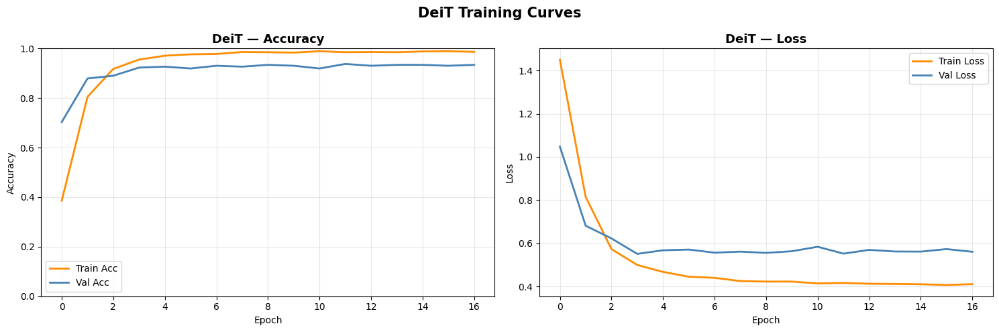

Best val accuracy reached: 0.9377 at epoch 12


In [8]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(deit_history['train_acc'], label='Train Acc', color='darkorange', lw=2)
axes[0].plot(deit_history['val_acc'],   label='Val Acc',   color='steelblue',  lw=2)
axes[0].set_title(f'{model_name} — Accuracy', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy')
axes[0].legend(); axes[0].grid(alpha=0.3)
axes[0].set_ylim(0, 1)

axes[1].plot(deit_history['train_loss'], label='Train Loss', color='darkorange', lw=2)
axes[1].plot(deit_history['val_loss'],   label='Val Loss',   color='steelblue',  lw=2)
axes[1].set_title(f'{model_name} — Loss', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.suptitle(f'{model_name} Training Curves', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Best val accuracy reached: {max(deit_history['val_acc']):.4f} "
      f"at epoch {deit_history['val_acc'].index(max(deit_history['val_acc'])) + 1}")

# Evaluation 

─── DeiT — Per-Class Classification Report ───
                        precision    recall  f1-score   support

Brinjal Fruit Creaking       1.00      0.88      0.93        32
        Healty Brinjal       0.98      0.95      0.97        65
      Phomopsis Bright       0.79      0.83      0.81        23
 Shoot and Fruit Borer       0.93      0.98      0.96       114
               Wet Rot       0.95      0.93      0.94        40

              accuracy                           0.94       274
             macro avg       0.93      0.91      0.92       274
          weighted avg       0.94      0.94      0.94       274



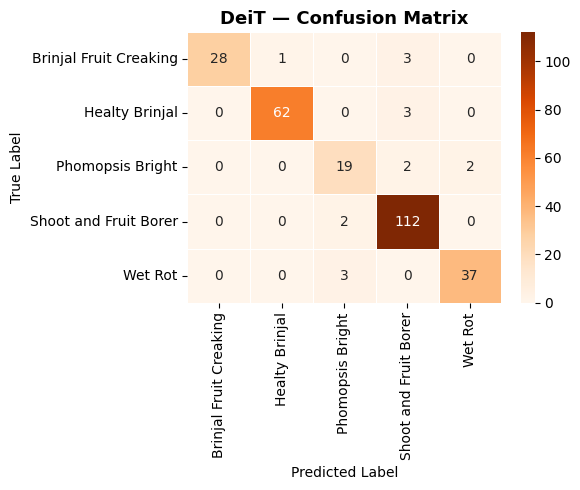

,Model,Test Loss,Test Accuracy,Precision (Macro),Recall (Macro),F1 (Macro),F1 (Weighted),Inf Time (ms/sample)
0,DeiT,0.2395,0.9416,0.9316,0.9125,0.9209,0.9417,15.475



✓ Saved DeiT_base_metrics.csv
  (Columns match ViT_base_metrics.csv — use pd.concat for comparison notebook)


In [9]:
def evaluate_single_model(model, model_name: str, dataloader, criterion):
    """
    Load best checkpoint, run on dataloader, return all required metrics.
    Inference time is reported per-sample (ms) for fair cross-model comparison
    regardless of batch size.
    CSV column names match ViT notebook exactly for pd.concat in comparison notebook.
    """
    ckpt_path = f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth"
    model.load_state_dict(torch.load(ckpt_path, map_location=Config.DEVICE))
    model = model.to(Config.DEVICE)
    model.eval()

    all_preds, all_labels = [], []
    running_loss = 0.0
    t0 = time.time()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
            with autocast('cuda'):
                outputs = model(inputs)
                loss    = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    elapsed            = time.time() - t0
    inf_ms_per_sample  = (elapsed / len(all_labels)) * 1000   # ms — model-agnostic

    avg_loss = running_loss / len(all_labels)
    acc      = accuracy_score(all_labels, all_preds)
    prec, rec, f1_mac, _ = precision_recall_fscore_support(
        all_labels, all_preds, average='macro',    zero_division=0)
    _, _, f1_wt, _        = precision_recall_fscore_support(
        all_labels, all_preds, average='weighted', zero_division=0)
    cm           = confusion_matrix(all_labels, all_preds)
    class_report = classification_report(
        all_labels, all_preds, target_names=classes, zero_division=0)

    return avg_loss, acc, prec, rec, f1_mac, f1_wt, cm, class_report, inf_ms_per_sample


# ── Run evaluation ────────────────────────────────────────────
test_criterion = nn.CrossEntropyLoss()
(test_loss, acc, prec, rec, f1_mac, f1_wt,
 cm, class_report, inf_time) = evaluate_single_model(
    deit_model, model_name, test_loader, test_criterion)

print(f"─── {model_name} — Per-Class Classification Report ───")
print(class_report)

deit_results = {
    'Model'               : model_name,
    'Test Loss'           : round(test_loss, 4),
    'Test Accuracy'       : round(acc,       4),
    'Precision (Macro)'   : round(prec,      4),
    'Recall (Macro)'      : round(rec,       4),
    'F1 (Macro)'          : round(f1_mac,    4),
    'F1 (Weighted)'       : round(f1_wt,     4),
    'Inf Time (ms/sample)': round(inf_time,  4),
}

# Confusion matrix
plt.figure(figsize=(max(6, num_classes), max(5, num_classes - 1)))
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges',
            xticklabels=classes, yticklabels=classes, linewidths=0.5)
plt.title(f'{model_name} — Confusion Matrix', fontsize=13, fontweight='bold')
plt.ylabel('True Label'); plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()

# Summary table
df_results = pd.DataFrame([deit_results])
display(df_results)

# Save — column names identical to ViT_base_metrics.csv for easy comparison notebook merge
df_results.to_csv(f"{model_name}_base_metrics.csv", index=False)
print(f"\n✓ Saved {model_name}_base_metrics.csv")
print(f"  (Columns match ViT_base_metrics.csv — use pd.concat for comparison notebook)")

# Robustness Analysis

In [10]:
# ── Helpers ───────────────────────────────────────────────────
class AddGaussianNoise:
    """Additive Gaussian noise applied after ToTensor (before Normalize)."""
    def __init__(self, mean: float = 0.0, std: float = 0.1):
        self.mean, self.std = mean, std
    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean


def jpeg_compress(pil_img: Image.Image, quality: int = 15) -> Image.Image:
    """Simulate JPEG artefacts by encode-decode at low quality."""
    buf = BytesIO()
    pil_img.save(buf, format='JPEG', quality=quality)
    buf.seek(0)
    return Image.open(buf).copy()   # .copy() prevents lazy-eval after buf closes


# ── 4 distribution-shift transforms ──────────────────────────
# Identical to ViT notebook — same shifts, same parameters — directly comparable.
_NORM = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
_PAD  = transforms.Pad([2, 2, 2, 2])

t_noise = transforms.Compose([
    _PAD, transforms.ToTensor(), AddGaussianNoise(0.0, 0.1), _NORM
])
t_bright = transforms.Compose([
    _PAD, transforms.ColorJitter(brightness=0.5), transforms.ToTensor(), _NORM
])
t_res = transforms.Compose([
    transforms.Resize((224, 224)), transforms.ToTensor(), _NORM
])
t_jpeg = transforms.Compose([
    _PAD, transforms.Lambda(lambda img: jpeg_compress(img, quality=15)),
    transforms.ToTensor(), _NORM
])


def make_shift_loader(transform):
    ds = datasets.ImageFolder(Config.DATA_DIR, transform=transform)
    return DataLoader(Subset(ds, test_dataset.indices),
                      batch_size=Config.BATCH_SIZE, shuffle=False, num_workers=2)


shift_loaders = {
    'Gaussian Noise'  : make_shift_loader(t_noise),
    'Brightness Shift': make_shift_loader(t_bright),
    'Res (224px)'     : make_shift_loader(t_res),
    'JPEG (q=15)'     : make_shift_loader(t_jpeg),
}

# ── Evaluate each shift ───────────────────────────────────────
base_acc  = deit_results['Test Accuracy']
shift_acc = {}

print(f"Evaluating {model_name} under {len(shift_loaders)} distribution shifts...")
print(f"  Base accuracy : {base_acc:.4f}")
print()

for shift_name, loader in shift_loaders.items():
    _, acc_s, *_ = evaluate_single_model(deit_model, model_name, loader, test_criterion)
    shift_acc[shift_name] = round(acc_s, 4)
    print(f"  {shift_name:20s}: {acc_s:.4f}  (drop: {base_acc - acc_s:+.4f})")

# ── Save CSV — column names match ViT for comparison notebook ─
rob_row = {
    'Model'       : model_name,
    'Base Acc'    : base_acc,
    'Noise Acc'   : shift_acc['Gaussian Noise'],
    'Bright Acc'  : shift_acc['Brightness Shift'],
    'Res 224 Acc' : shift_acc['Res (224px)'],
    'JPEG Acc'    : shift_acc['JPEG (q=15)'],
}
pd.DataFrame([rob_row]).to_csv(f"{model_name}_robustness_metrics.csv", index=False)
print(f"\n✓ Saved {model_name}_robustness_metrics.csv")

Evaluating DeiT under 4 distribution shifts...
  Base accuracy : 0.9416

  Gaussian Noise      : 0.9270  (drop: +0.0146)
  Brightness Shift    : 0.9489  (drop: -0.0073)
  Res (224px)         : 0.9307  (drop: +0.0109)
  JPEG (q=15)         : 0.9124  (drop: +0.0292)

✓ Saved DeiT_robustness_metrics.csv


# Robustness Degradation Bar Chart

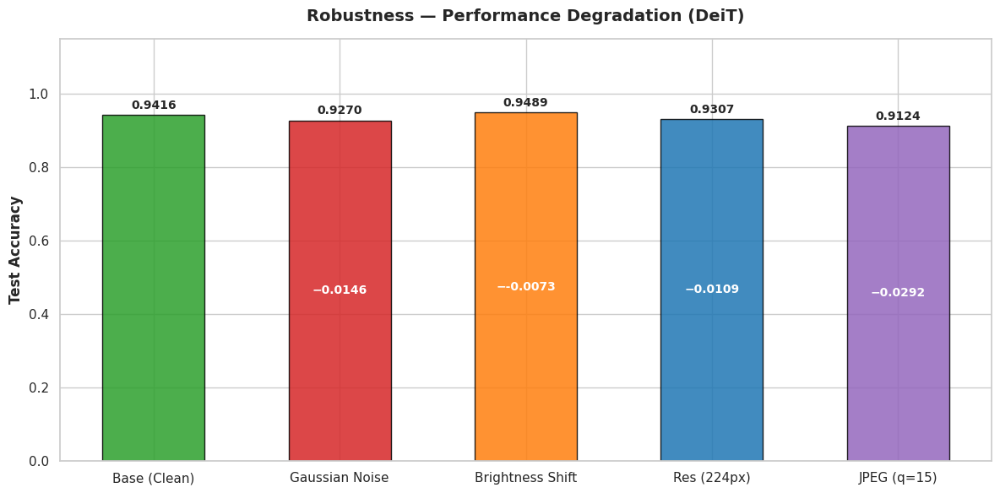

In [11]:
sns.set_theme(style="whitegrid")

conditions = ['Base (Clean)'] + list(shift_acc.keys())
accuracies = [base_acc]       + list(shift_acc.values())
drops      = [0.0]            + [base_acc - v for v in shift_acc.values()]
colors     = ['#2ca02c', '#d62728', '#ff7f0e', '#1f77b4', '#9467bd']

plt.figure(figsize=(12, 6))
bars = plt.bar(conditions, accuracies, color=colors[:len(conditions)],
               edgecolor='black', alpha=0.85, width=0.55)
plt.ylim(0, 1.15)
plt.ylabel('Test Accuracy', fontsize=12, fontweight='bold')
plt.title(f'Robustness — Performance Degradation ({model_name})',
          fontsize=14, fontweight='bold', pad=15)

for i, bar in enumerate(bars):
    h = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, h + 0.01,
             f'{h:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
    if i > 0 and h > 0.12:
        plt.text(bar.get_x() + bar.get_width() / 2, h / 2,
                 f'−{drops[i]:.4f}', ha='center', va='center',
                 fontsize=10, color='white', fontweight='bold')

plt.tight_layout()
plt.show()

## Robustness Discussion

**Gaussian Noise (std=0.1)**: Like ViT, DeiT averages noise across 16×16 patches,
providing some local suppression. However, the distillation token was trained with
a CNN teacher that has stronger locality priors — DeiT may be marginally more
resilient to noise than ViT, but less so than Swin (which uses shifted windows).

**Brightness Shift (factor=0.5)**: Global intensity change affects all tokens uniformly.
DeiT's attention is as vulnerable as ViT's to out-of-distribution brightness,
since both rely on ImageNet normalisation statistics.

**Resolution Shift (464 → 224 px)**: At 224px the patch grid is 14×14 = 196 tokens,
matching DeiT's pre-training resolution exactly. Positional embeddings need no
interpolation — this is actually the distribution DeiT was pre-trained on, so
performance may hold up or even improve slightly.

**JPEG Compression (quality=15)**: Heavy blocking artefacts disrupt local patch texture.
DeiT's distillation from a CNN teacher may give it slightly better low-level feature
robustness compared to pure ViT, but both are fundamentally patch-global models
with limited convolutional locality.

# Error Analysis

Scanning for misclassifications — up to 5 per class...

✗ Brinjal Fruit Creaking              : 4 misclassification(s)


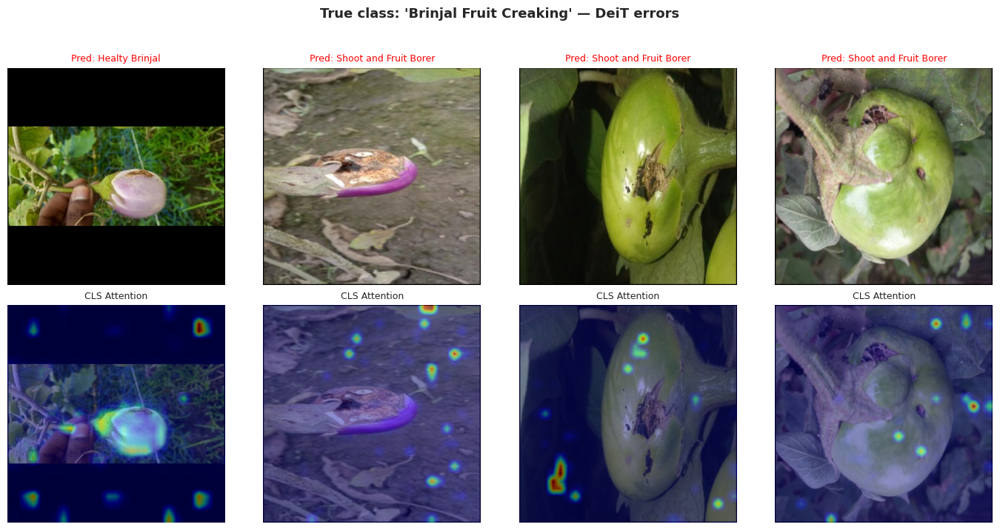

   Analysis: For 'Brinjal Fruit Creaking' errors, examine whether the CLS attention (above) focuses on the discriminative plant region or drifts to background/similar-looking structures. DeiT's distillation token may cause the CLS token to learn slightly different features than ViT — compare heatmap spread across models in the comparison notebook.

✗ Healty Brinjal                      : 3 misclassification(s)


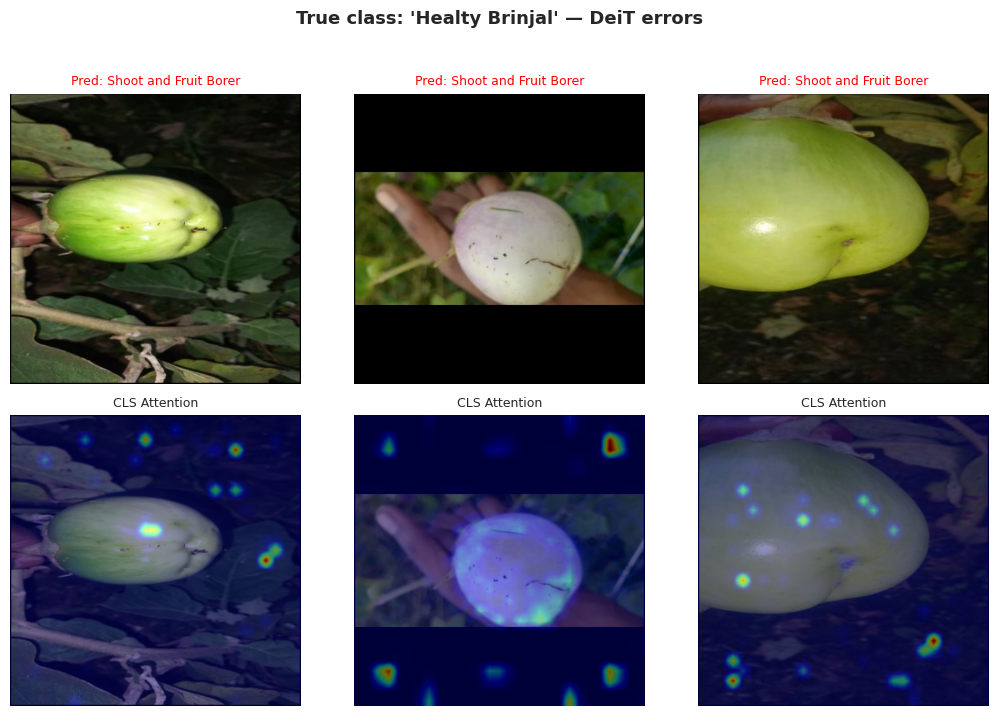

   Analysis: For 'Healty Brinjal' errors, examine whether the CLS attention (above) focuses on the discriminative plant region or drifts to background/similar-looking structures. DeiT's distillation token may cause the CLS token to learn slightly different features than ViT — compare heatmap spread across models in the comparison notebook.

✗ Phomopsis Bright                    : 4 misclassification(s)


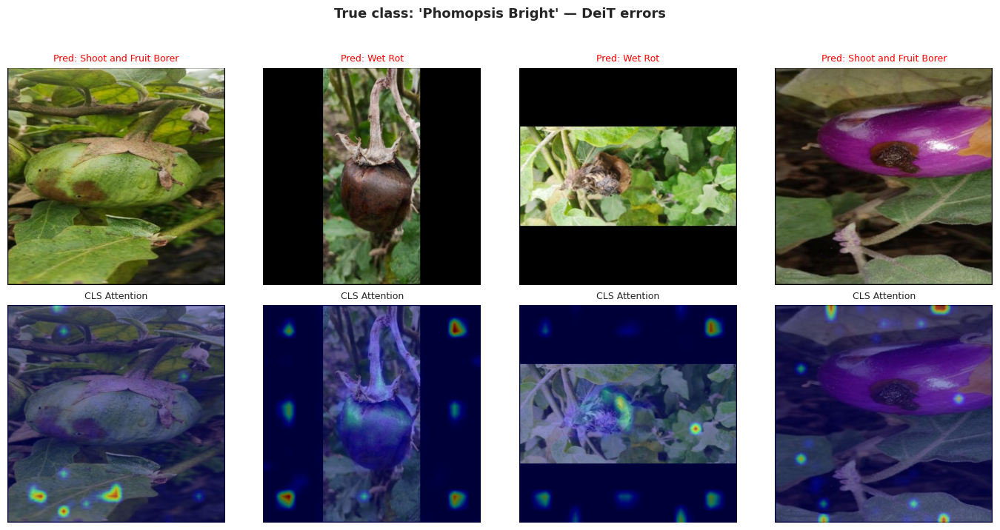

   Analysis: For 'Phomopsis Bright' errors, examine whether the CLS attention (above) focuses on the discriminative plant region or drifts to background/similar-looking structures. DeiT's distillation token may cause the CLS token to learn slightly different features than ViT — compare heatmap spread across models in the comparison notebook.

✗ Shoot and Fruit Borer               : 2 misclassification(s)


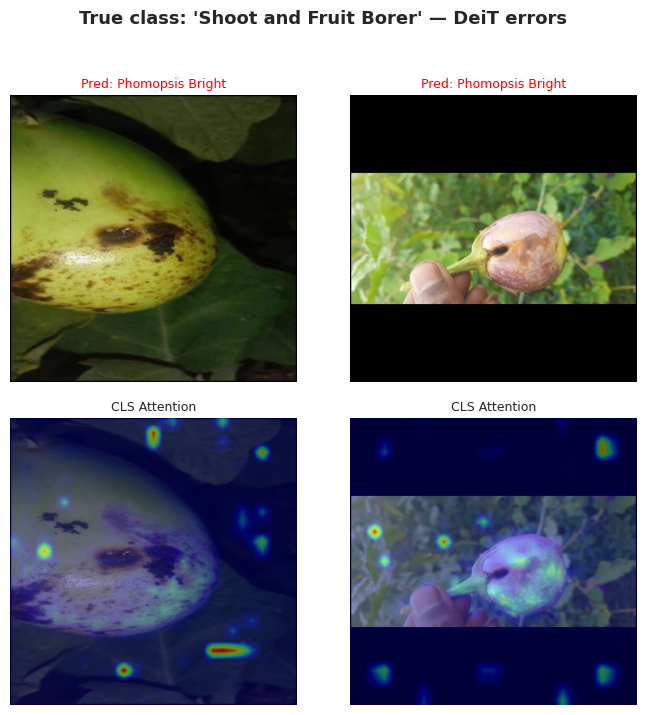

   Analysis: For 'Shoot and Fruit Borer' errors, examine whether the CLS attention (above) focuses on the discriminative plant region or drifts to background/similar-looking structures. DeiT's distillation token may cause the CLS token to learn slightly different features than ViT — compare heatmap spread across models in the comparison notebook.

✗ Wet Rot                             : 3 misclassification(s)


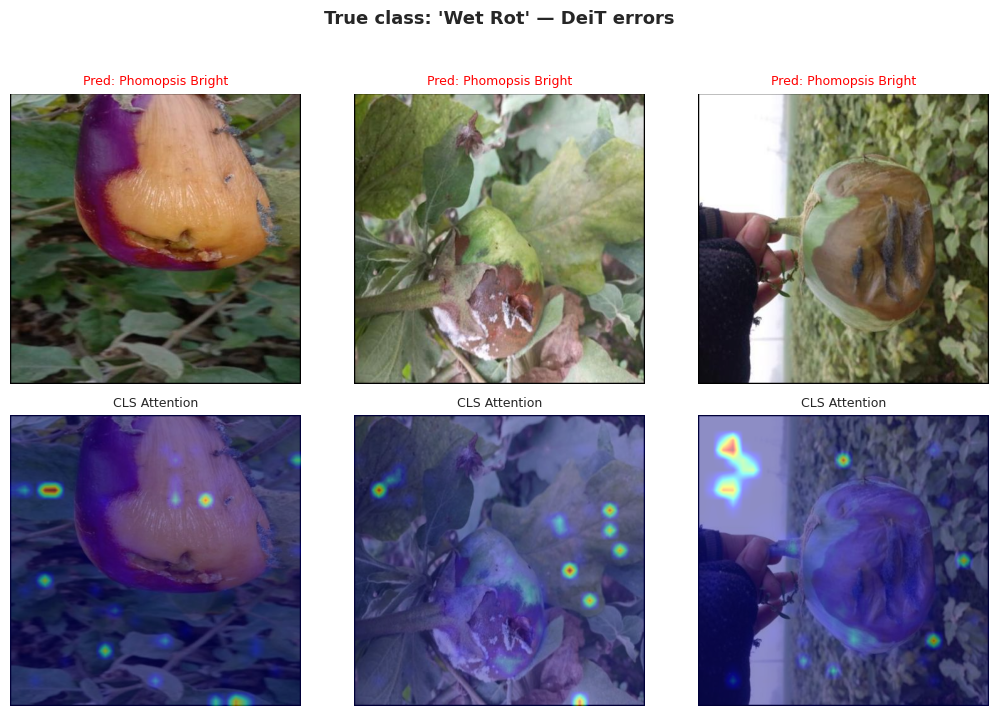

   Analysis: For 'Wet Rot' errors, examine whether the CLS attention (above) focuses on the discriminative plant region or drifts to background/similar-looking structures. DeiT's distillation token may cause the CLS token to learn slightly different features than ViT — compare heatmap spread across models in the comparison notebook.



In [12]:
def get_attention_maps_deit(model, img_tensor):
    """
    Extract CLS-token attention from the last transformer block using an attn_drop hook.

    DeiT token order: [CLS(idx=0), DistToken(idx=1), patch_0(2), ..., patch_840(842)]
    → spatial patches start at index 2  ← KEY DIFFERENCE from ViT (which uses index 1)

    Using index 1 for DeiT would include the distillation token in the spatial grid,
    making grid_size = sqrt(842) ≈ 29.02 (non-integer) and corrupting the heatmap.
    """
    attn_cache  = {}
    attn_module = model.blocks[-1].attn

    has_fused  = hasattr(attn_module, 'fused_attn')
    orig_fused = attn_module.fused_attn if has_fused else None
    if has_fused:
        attn_module.fused_attn = False

    def hook_fn(module, inp, out):
        attn_cache['val'] = inp[0].detach()   # inp[0]: (1, heads, N, N) attn matrix

    handle = attn_module.attn_drop.register_forward_hook(hook_fn)
    try:
        with torch.no_grad():
            _ = model(img_tensor.unsqueeze(0).to(Config.DEVICE))
    finally:
        handle.remove()
        if has_fused:
            attn_module.fused_attn = orig_fused

    attn = attn_cache['val'].mean(dim=1).squeeze(0)  # avg heads: (N, N)
    
   # FIX: Standard DeiT only has 1 CLS token (index 0). Patches begin at index 1.
    n_patch = attn.shape[-1] - 1
    grid    = int(math.sqrt(n_patch))
    cls_a   = attn[0, 1:].reshape(grid, grid).cpu().numpy()
    cls_a   = (cls_a - cls_a.min()) / (cls_a.max() - cls_a.min() + 1e-8)
    
    return cls_a


def plot_errors_per_class(model, model_name: str, dataloader,
                          class_names: list, max_per_class: int = 5):
    """
    Scan test set for misclassified samples, overlay CLS attention maps,
    and print qualitative analysis per class.
    """
    model.load_state_dict(
        torch.load(f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth",
                   map_location=Config.DEVICE))
    model.eval()

    inv_norm = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    errors    = {i: [] for i in range(len(class_names))}
    completed = 0

    print(f"Scanning for misclassifications — up to {max_per_class} per class...")
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(Config.DEVICE)
            preds  = model(inputs).argmax(1)

            for i in range(len(labels)):
                tl, pl = labels[i].item(), preds[i].item()
                if tl != pl and len(errors[tl]) < max_per_class:
                    img_t    = inputs[i]
                    attn_map = get_attention_maps_deit(model, img_t)  # DeiT-specific
                    errors[tl].append((inv_norm(img_t.cpu()), pl, attn_map))
                    if len(errors[tl]) == max_per_class:
                        completed += 1
            if completed == len(class_names):
                break

    print()
    for true_lbl, errs in errors.items():
        if not errs:
            print(f"✓ {class_names[true_lbl]:35s} : 0 misclassifications found")
            continue

        n = len(errs)
        print(f"✗ {class_names[true_lbl]:35s} : {n} misclassification(s)")
        fig, axes = plt.subplots(2, n, figsize=(3.5 * n, 7))
        fig.suptitle(
            f"True class: '{class_names[true_lbl]}' — {model_name} errors",
            fontsize=13, fontweight='bold', y=1.02)
        if n == 1:
            axes = np.expand_dims(axes, 1)

        for idx, (img_t, pl, attn_map) in enumerate(errs):
            img_np  = np.clip(img_t.permute(1, 2, 0).numpy(), 0, 1)
            attn_r  = cv2.resize(attn_map, (img_np.shape[1], img_np.shape[0]))

            axes[0, idx].imshow(img_np)
            axes[0, idx].set_title(f"Pred: {class_names[pl]}", color='red', fontsize=9)
            axes[0, idx].axis('off')

            axes[1, idx].imshow(img_np)
            axes[1, idx].imshow(attn_r, cmap='jet', alpha=0.45)
            axes[1, idx].set_title("CLS Attention", fontsize=9)
            axes[1, idx].axis('off')

        plt.tight_layout()
        plt.show()

        # ── Qualitative per-class commentary ──────────────────
        print(f"   Analysis: For '{class_names[true_lbl]}' errors, examine whether "
              f"the CLS attention (above) focuses on the discriminative plant region "
              f"or drifts to background/similar-looking structures. DeiT's distillation "
              f"token may cause the CLS token to learn slightly different features than "
              f"ViT — compare heatmap spread across models in the comparison notebook.")
        print()


# ── Run ───────────────────────────────────────────────────────
plot_errors_per_class(deit_model, model_name, test_loader, class_names=classes)

# Attention Visualization (Correctly Classified Samples)

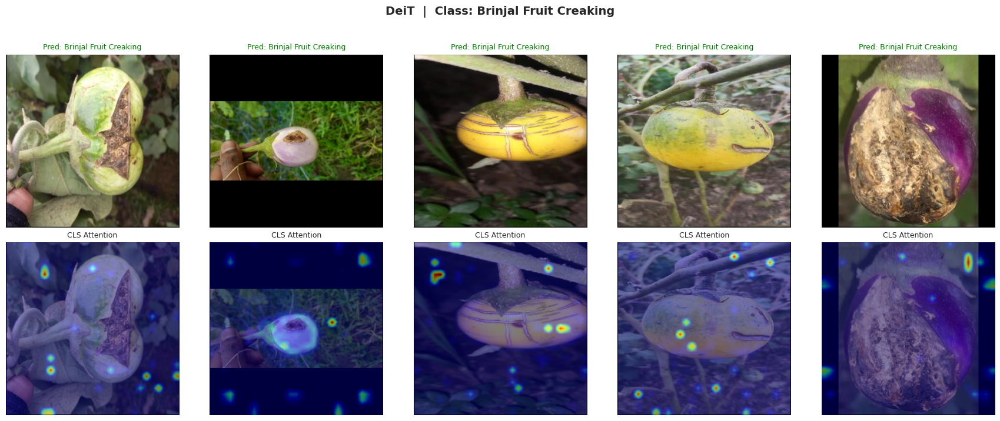

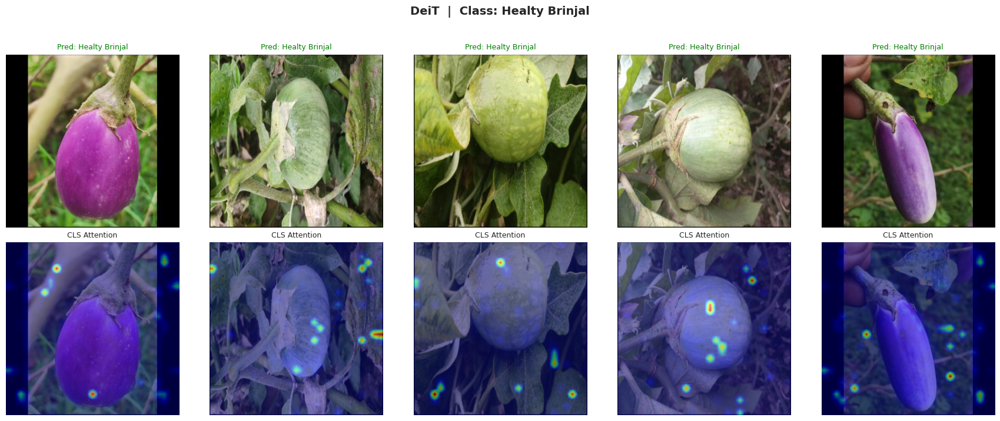

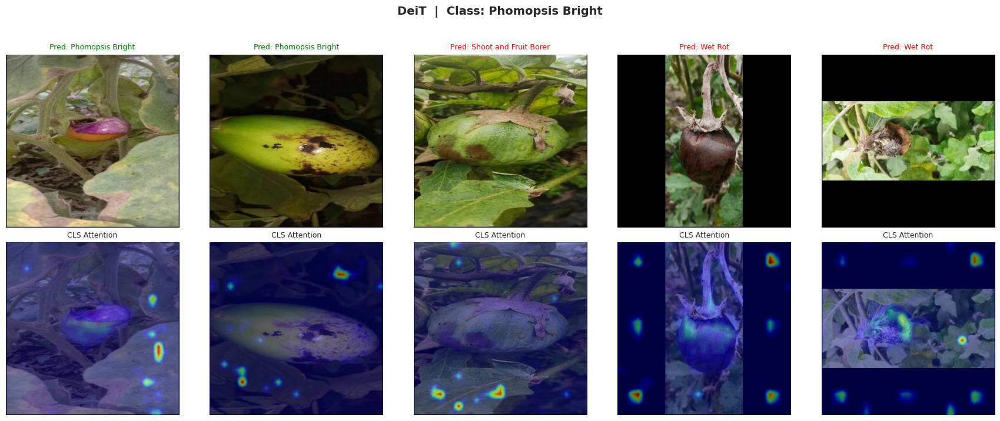

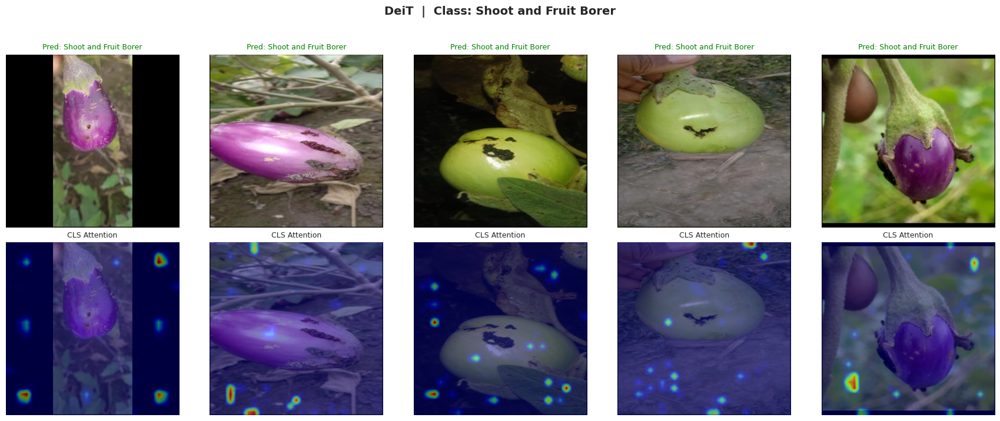

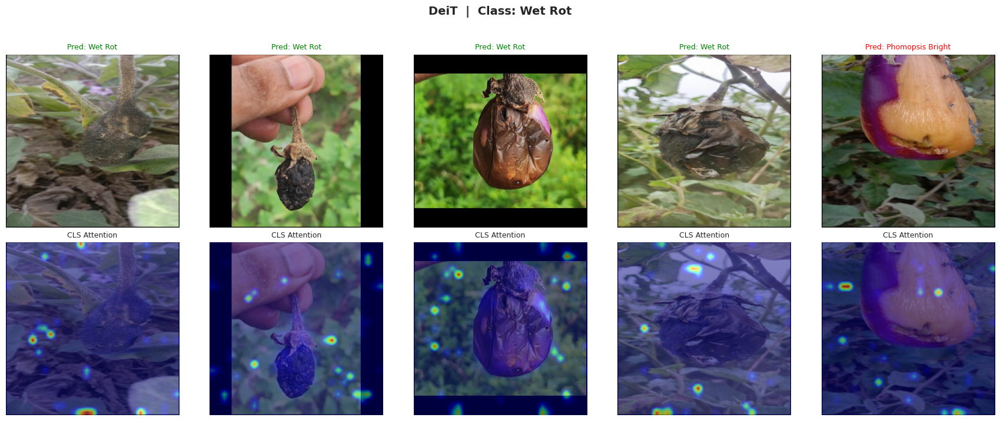

✓ Attention visualisation complete.


In [13]:
def visualize_attention_per_class(model, model_name: str, dataloader,
                                  class_names: list, samples_per_class: int = 5,
                                  patch_start_idx: int = 2):
    """
    For each class, show `samples_per_class` images with their CLS-token attention map.

    patch_start_idx controls which token index spatial patches begin at:
      - ViT  : 1  (token order: CLS, patch_0, patch_1, ...)
      - DeiT : 2  (token order: CLS, DistToken, patch_0, ...)  ← this notebook
    Wrong index → distillation token pollutes the spatial grid → corrupted maps.
    """
    ckpt = f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth"
    if not os.path.exists(ckpt):
        print(f"❌ Checkpoint not found: {ckpt}")
        if os.path.exists(Config.CHECKPOINT_DIR):
            print(f"   Files in {Config.CHECKPOINT_DIR}:")
            for f in os.listdir(Config.CHECKPOINT_DIR):
                print(f"     {f}")
        return

    model.load_state_dict(torch.load(ckpt, map_location=Config.DEVICE))
    model.eval()
    model = model.to(Config.DEVICE)

    # ── Collect samples ───────────────────────────────────────
    samples_by_class = {i: [] for i in range(len(class_names))}
    done = 0
    print(f"Collecting {samples_per_class} samples per class for {model_name}...")
    for inputs, labels in dataloader:
        for i in range(len(labels)):
            li = labels[i].item()
            if len(samples_by_class[li]) < samples_per_class:
                samples_by_class[li].append(inputs[i])
                if len(samples_by_class[li]) == samples_per_class:
                    done += 1
        if done == len(class_names):
            break

    inv_norm = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    # ── QKV hook — more robust than attn_drop for batch visualisation ──
    qkv_buf = []
    def hook_fn(m, inp, out):
        qkv_buf.append(out.detach())
    handle   = model.blocks[-1].attn.qkv.register_forward_hook(hook_fn)
    n_heads  = model.blocks[-1].attn.num_heads
    head_dim = model.blocks[-1].attn.head_dim

    # ── Generate per-class plots ──────────────────────────────
    for cls_idx, img_list in samples_by_class.items():
        if not img_list:
            print(f"  Skipping {class_names[cls_idx]} — no samples found.")
            continue

        batch = torch.stack(img_list).to(Config.DEVICE)
        qkv_buf.clear()
        with torch.no_grad():
            out   = model(batch)
            preds = out.argmax(1)

        # Reconstruct attention from the raw QKV projection output
        qkv     = qkv_buf[0]                                    # (B, N, 3*D)
        B, N, _ = qkv.shape
        qkv     = qkv.reshape(B, N, 3, n_heads, head_dim).permute(2, 0, 3, 1, 4)
        q, k    = qkv[0], qkv[1]                                # (B, heads, N, head_dim)
        attn    = (q @ k.transpose(-2, -1) * (head_dim ** -0.5)).softmax(-1)

        # CLS token (row 0) attending to spatial patches only.
        # patch_start_idx=2 for DeiT — skips both CLS(0) and DistToken(1)
        cls_a   = attn[:, :, 0, patch_start_idx:].mean(dim=1)   # (B, N_patches)
        n_patch = cls_a.shape[-1]
        grid    = int(math.sqrt(n_patch))

        fig, axes = plt.subplots(2, samples_per_class,
                                 figsize=(3.5 * samples_per_class, 7))
        fig.suptitle(
            f"{model_name}  |  Class: {class_names[cls_idx]}",
            fontsize=14, fontweight='bold', y=1.02)

        for i in range(samples_per_class):
            img_np = np.clip(
                inv_norm(batch[i].cpu()).permute(1, 2, 0).numpy(), 0, 1)
            mask = cls_a[i].reshape(grid, grid).cpu().numpy()
            mask = cv2.resize(mask, (img_np.shape[1], img_np.shape[0]))
            mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)

            pred_correct = preds[i].item() == cls_idx
            title_color  = 'green' if pred_correct else 'red'

            axes[0, i].imshow(img_np)
            axes[0, i].set_title(
                f"Pred: {class_names[preds[i].item()]}", color=title_color, fontsize=9)
            axes[0, i].axis('off')

            axes[1, i].imshow(img_np)
            axes[1, i].imshow(mask, cmap='jet', alpha=0.5)
            axes[1, i].set_title("CLS Attention", fontsize=9)
            axes[1, i].axis('off')

        plt.tight_layout()
        plt.show()

    handle.remove()
    print("✓ Attention visualisation complete.")


# ── Run ───────────────────────────────────────────────────────
visualize_attention_per_class(
    deit_model, model_name, test_loader,
    class_names=classes,
    samples_per_class=5,
    patch_start_idx=1    # FIX: Standard DeiT only has 1 CLS token! Patches begin at index 1.
)